## PRACA DOMOWA

Pracę domową (**pojedynczy plik** notatnika z rozszerzeniem .ipynb) należy przesłać za pośrednictwem platformy *MS Teams* (moduł Zadania) do poniedziałku **29 stycznia 2024 roku do godziny 9:00**. Przesłanie rozwiązania po terminie skutkuje otrzymaniem 0 punktów za tę pracę domową.

**D1** (*4 punkty*). Znajdź rozwiązanie zagadnienia 
$$\begin{cases} u_{tt} - c^2 u_{xx} = 0 &\text{w zbiorze }(0,L)\times(0,T_0), \\
u(0,t) = u(L,t) &\text{dla }t\in(0,T_0),\\
u(x,0) = u_0(x) &\text{dla }x\in(0,L),\\
u_t(x,0) = 0 &\text{dla }x\in(0,L), \end{cases}$$
gdzie $L = 1{,}2$, $T_0 = 2{,}4$, $c = 1$ oraz 
$$ u_0(x) = \cos^2\left(\frac{x-0{,}6}{0{,}2}\pi\right)\cdot\chi_{(0{,}5, 0{,}7)}(x).$$
Użyj w tym celu dwóch metod:
1. metody Fouriera, sumując pierwsze 30 wyrazów szeregu Fouriera dla danych początkowych,
2. metody różnic skończonych, używając schematu z parametrami $h=\frac{1}{60}$, $\lambda=0{,}8$.

Wykorzystując poniższe polecenia z pakietu `time`:
```
start = time.time()
...
end = time.time()
print(end - start)
```
zmierz czas wykonywania obliczeń przy obu metodach. Ponadto porównaj ze sobą wyniki uzyskane każdą z tych metod, wykonując animację, na której wyświetlisz obydwa rozwiązania. Jakie zalety i wady każdej z nich można zauważyć na podstawie uzyskanych wyników? Wymień po jednej zalecie i wadzie dla obu metod.

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import square, sawtooth
from scipy.integrate import quad
from math import*
import matplotlib.animation as anim
from IPython.display import HTML
import time as time

**metoda Fouriera** rozwiązanie numeryczne

In [116]:
L = 1.2
c = 1
x = np.arange(0, L, 0.001)
f = (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2
fs = lambda x: (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2 * np.sin((i*np.pi*x)/L)
n = 30

In [117]:
Cn = []
sum = 0

for i in range(n):
    cn = quad(fs, 0, L)[0] * (2.0 / L)
    Cn.append(cn)

for i in range(n):
    if i == 0.0:
        sum = 0
    else:
        sum = sum + (Cn[i] * np.sin(i*np.pi*x / L))

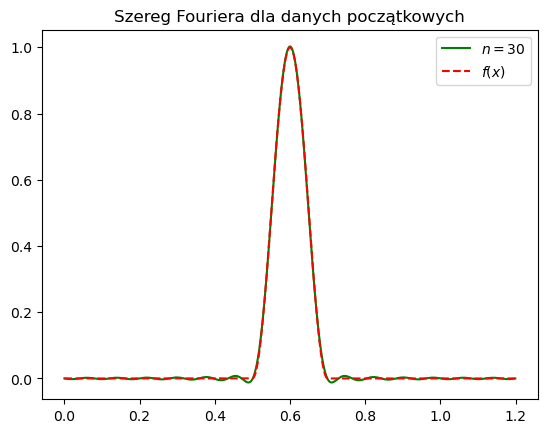

In [118]:
plt.plot(x, sum, 'g', label=r"$n=%d$" % n)
plt.plot(x, f, 'r--', label=r"$f(x)$")
plt.legend()
plt.title("Szereg Fouriera dla danych początkowych")
plt.show()

In [119]:
x_np = np.arange(0, L, 0.001)
t_np = np.arange(0, 2, 0.01)

X, T = np.meshgrid(x_np, t_np)
n = 30

U = 0
for i in range(n):
    if i == 0.0:
        U = 0
    else:
        U = U + (Cn[i] * np.sin(i * np.pi * X / L) * np.cos(i * np.pi * c * T / L))

In [121]:
print(U)

[[ 0.00000000e+00 -1.63244047e-04 -3.25476892e-04 ... -4.85693565e-04
  -3.25476892e-04 -1.63244047e-04]
 [ 0.00000000e+00 -1.15204887e-04 -2.29694736e-04 ... -3.42758924e-04
  -2.29694736e-04 -1.15204887e-04]
 [ 0.00000000e+00  7.65959153e-07  1.53115715e-06 ...  2.29481264e-06
   1.53115715e-06  7.65959153e-07]
 ...
 [ 0.00000000e+00  4.40435591e-04  8.78395336e-04 ...  1.31141402e-03
   8.78395336e-04  4.40435591e-04]
 [ 0.00000000e+00  1.15762786e-04  2.31410302e-04 ...  3.46823300e-04
   2.31410302e-04  1.15762786e-04]
 [ 0.00000000e+00 -2.23596284e-04 -4.45307049e-04 ... -6.63260903e-04
  -4.45307049e-04 -2.23596284e-04]]


**metoda różnic skończonych**

In [122]:
u0 = lambda x: (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2
v0 = lambda x: 0
fL = lambda t: 0
fR = lambda t: 0
x = [0, 1.2]
t = [0, 2.4]
h = 1/60;
lambd = 0.8

# korzystamy z warunku brzegowego Dirichleta

k = lambd*h
X = np.arange(x[0], x[1], h)
M = len(X)
T = np.arange(t[0], t[1], k)
N = len(T)
    
u = np.zeros((M, N))
    
# warunki początkowe
for m in range(0, M):
    u[m,0] = u0(X[m])
        
for m in range(1, M-1):
    u[m,1] = k*v0(X[m]) + u0(X[m]) + c**2 * lambd**2 * (u0(X[m+1]) - 2*u0(X[m]) + u0(X[m-1])) / 2
u[0,1] = fL(T[1])
u[M-1,1] = fR(T[1])
    
# główna pętla metody różnic skończonych
for n in range(1, N-1):
    for m in range(1,M-1):
        u[m,n+1] = 2*u[m,n] - u[m,n-1] + c**2 * lambd**2 * (u[m+1,n] - 2*u[m,n] + u[m-1,n])
    u[0,n+1] = fL(T[n+1])
    u[M-1,n+1] = fR(T[n+1])

In [123]:
print(u)

[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ... -0.00328794 -0.00050328
   0.00267431]
 [ 0.          0.          0.         ...  0.00205058 -0.00039262
  -0.00207259]
 ...
 [ 0.          0.          0.         ...  0.00032217  0.00204814
   0.00049401]
 [ 0.          0.          0.         ...  0.00101154 -0.00297394
  -0.00184197]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]


**porównanie czasów wykonania**

In [124]:
L = 1.2
c = 1
x = np.arange(0, L, 0.001)
f = (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2
fs = lambda x: (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2 * np.sin((i*np.pi*x)/L)
n = 30

start = time.time()
Cn = []
sum = 0

for i in range(n):
    cn = quad(fs, 0, L)[0] * (2.0 / L)
    Cn.append(cn)

for i in range(n):
    if i == 0.0:
        sum = 0
    else:
        sum = sum + (Cn[i] * np.sin(i*np.pi*x / L))
x_np = np.arange(0, L, 0.001)
t_np = np.arange(0, 2, 0.01)

X, T = np.meshgrid(x_np, t_np)
n = 30

U = 0
for i in range(n):
    if i == 0.0:
        U = 0
    else:
        U = U + (Cn[i] * np.sin(i * np.pi * X / L) * np.cos(i * np.pi * c * T / L))
end = time.time()
print(end-start)

0.17863893508911133


In [125]:
u0 = lambda x: (np.abs(x-0.6)<=0.1)*(np.cos(np.pi*(x-0.6)/0.2))**2
v0 = lambda x: 0
fL = lambda t: 0
fR = lambda t: 0
x = [0, 1.2]
t = [0, 2.4]
h = 1/60
lambd = 0.8
k = lambd*h
X = np.arange(x[0], x[1], h)
M = len(X)
T = np.arange(t[0], t[1], k)
N = len(T)
    
start = time.time()

for m in range(0, M):
    u[m,0] = u0(X[m])
for m in range(1, M-1):
    u[m,1] = k*v0(X[m]) + u0(X[m]) + c**2 * lambd**2 * (u0(X[m+1]) - 2*u0(X[m]) + u0(X[m-1])) / 2
u[0,1] = fL(T[1])
u[M-1,1] = fR(T[1])
for n in range(1, N-1):
    for m in range(1,M-1):
        u[m,n+1] = 2*u[m,n] - u[m,n-1] + c**2 * lambd**2 * (u[m+1,n] - 2*u[m,n] + u[m-1,n])
    u[0,n+1] = fL(T[n+1])
    u[M-1,n+1] = fR(T[n+1])
    
end = time.time()
print(end-start)

0.026670217514038086


Z powyższych otrzymujemy, że metoda różnic skończonyh jest szybsza od metody Fourriera

## animacje

Dla metody Fouriera

In [126]:
x = x_np
y = U[0,:]

fig, ax = plt.subplots(figsize = (7, 5))
wavepacket, = ax.plot(x, y, "-", color = "C3", lw = 2)

ax.set_xticks([0, 0.6, 1.2])
ax.set_yticks((-1, 0, 1))
ax.set_title("Drgająca struna")

def wave(i, c=1):
    # Pobranie kolejnej klatki czasowej
    new_y = U[i,:]
    wavepacket.set_ydata(new_y)
    return(wavepacket,)

# Wygenerowanie animacji
ani = anim.FuncAnimation(fig, wave, frames = 200, fargs = (-0.03,), interval = 50, blit = True)
plt.close()

In [127]:
HTML(ani.to_jshtml())

Dla metody różnic skończonych

In [128]:
fig, ax = plt.subplots(figsize = (7, 5))
wavepacket, = ax.plot(X, u[:,0], "-", color = "C3", lw = 2)

ax.set_xticks([0, 0.6, 1.2])
ax.set_yticks((-1, 0, 0.5, 1))
ax.set_title(r"Rozwiązanie równania falowego")

def wave(i, c=1):
    new_u = u[:,i]
    wavepacket.set_ydata(new_u)
    return(wavepacket,)

ani = anim.FuncAnimation(fig, wave, frames = N, fargs = (-0.03,),
                         interval = 50, blit = True)
plt.close()

In [129]:
HTML(ani.to_jshtml())

Animacja wspólna (niebieski: różnice skończone, czerwony: Fourier)

In [132]:
fig, ax = plt.subplots(figsize=(7, 5))
line1, = ax.plot(x, U[0, :], "-", color="C3", lw=2, label='Metoda Fouriera')
line2, = ax.plot(X, u[:, 0], "-", color="C0", lw=2, label = 'Metoda różnic skończonych')

ax.set_xticks([0, 0.6, 1.2])
ax.set_yticks((-1, 0, 1))
ax.set_title("Drgająca struna i Rozwiązanie równania falowego")
ax.legend()

def wave(i, c=1):
    new_y = U[i, :]
    new_u = u[:, i]
    line1.set_ydata(new_y)
    line2.set_ydata(new_u)
    return line1, line2

ani = anim.FuncAnimation(fig, wave, frames=N, fargs=(-0.03,), interval=50, blit=True)
plt.close()

In [133]:
HTML(ani.to_jshtml())

Zdecydowaną zaletą metody różnic skończonych jest to, że jest szybsza od metody Fouriera.
Jednak na animacji widzimy, że wraz z czasem to metoda różnic skończonych staje się mniej gładka. 